<h1 align="center">Volume 2: The Fourier Transform.</h1>

    <Neal>
    <Section 2>
    <12/3/2018>

<h2 align="center">Part 1: The Discrete Fourier Transform</h2>

In [2]:
from matplotlib import pyplot as plt
from scipy.io import wavfile
import numpy as np
import IPython
from scipy import fftpack
from scipy.fftpack import fft, ifft, fft2, ifft2
from scipy import signal
import imageio

In [3]:
plt.rcParams["figure.dpi"] = 300             # Fix plot quality.
plt.rcParams["figure.figsize"] = (12,3)      # Change plot size / aspect (you may adjust this).

In [81]:
class SoundWave(object):
    """A class for working with digital audio signals."""

    # Problem 1.1
    def __init__(self, rate, samples):
        """Set the SoundWave class attributes.

        Parameters:
            rate (int): The sample rate of the sound.
            samples ((n,) ndarray): NumPy array of samples.
        """
        self.rate = rate                                      # simply save the given rate and samples
        self.samples = np.array(samples)

    # Problems 1.1 and 1.7
    def plot(self, dft = False):
        """Plot the graph of the sound wave (time versus amplitude)."""
        seconds = len(self.samples)/self.rate                           # plots the soundwave in time vs. amplitude
        timespace = np.linspace(0,seconds,len(self.samples))
        plt.ylim(-32768,32767)
        plt.plot(timespace,self.samples)
        plt.title("Sound Wave")
        plt.xlabel("Time (seconds)")
        plt.ylabel("Samples")
        plt.show()
        
        if dft:
            plt.subplot()
            array = fftpack.fft(self.samples)
            x = np.arange(len(self.samples))*self.rate/len(self.samples)
            plt.xlabel("Frequency (Hz)")
            plt.ylabel("Magnitude")
            plt.title("Frequency Breakdown of Soundwave")
            plt.xlim(0,max(x)/2)
            plt.plot(x,np.abs(array))
            plt.show()

    # Problem 1.2
    def export(self, filename, force=False):
        """Generate a wav file from the sample rate and samples. 
        If the array of samples is not of type np.int16, scale it before exporting.

        Parameters:
            filename (str): The name of the wav file to export the sound to.
        """
        samples = self.samples                                          
        if force or not isinstance(self.samples[0], np.int16):  # this changes it to np.int16 type if it is not already
            samples = np.int16(np.real((self.samples * 32767.0)/(np.max(np.abs(self.samples)))))
        wavfile.write(filename,rate,samples)
    
    # Problem 1.4
    def __add__(self, other):
        """Combine the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to add
                to the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the combined samples.

        Raises:
            ValueError: if the two sample arrays are not the same length.
        """
        if len(self.samples) != len(other.samples):                         # add the amplitudes componentwise
            raise ValueError("Lengths of samples are not the same")
        newsamples = self.samples + other.samples
        return(SoundWave(self.rate,newsamples))

    # Problem 1.4
    def __rshift__(self, other):
        """Concatentate the samples from two SoundWave objects.

        Parameters:
            other (SoundWave): An object containing the samples to concatenate
                to the samples contained in this object.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:                                  # appends one wave onto another
            raise ValueError("Rates of samples are not the same")
        newsamples = np.append(self.samples,other.samples)
        return(SoundWave(self.rate,newsamples))    
    
    # Problem 2.1
    def __mul__(self, other):
        """Convolve the samples from two SoundWave objects using circular convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:                                  #raise an error if rates are not the same
            raise ValueError("Rates of samples are not the same")
            
        if len(self.samples) > len(other.samples):   # the following appends zeros to the shorter array
            other.samples = np.append(other.samples,np.zeros(len(self.samples) - len(other.samples)))
        elif len(self.samples) < len(other.samples):
            self.samples = np.append(self.samples,np.zeros(len(other.samples) - len(self.samples)))
            
        conv = ifft((fft(self.samples))*(fft(other.samples))).real  # this computes the convolution
        return(SoundWave(self.rate,conv)) 

    # Problem 2.2
    def __pow__(self, other):
        """Convolve the samples from two SoundWave objects using linear convolution.
        
        Parameters:
            other (SoundWave): An object containing the samples to convolve
                with the samples contained in this object.
        
        Returns:
            (SoundWave): A new SoundWave instance with the convolved samples.

        Raises:
            ValueError: if the two sample rates are not equal.
        """
        if self.rate != other.rate:                                  #raise an error if rates are not the same
            raise ValueError("Rates of samples are not the same")
            
        constant = len(self.samples) + len(other.samples) - 1
        
        a=0
        # find the smallest 2**a where 2**a >= n+m-1
        while 2**a < constant:
            a += 1
        
       
        # appends enough zeros to each such that they are padded to have 2**a entries
        f = np.append(self.samples,np.zeros(2**a - len(self.samples)))
        g = np.append(other.samples,np.zeros(2**a - len(other.samples)))
        
        conv = ifft((fft(f))*(fft(g))).real  # this computes the convolution
        return(SoundWave(self.rate,conv[:constant + 1]))

    # Problem 2.4
    def clean(self, low_freq, high_freq):
        """Remove a range of frequencies from the samples using the DFT. 

        Parameters:
            low_freq (float): Lower bound of the frequency range to zero out.
            high_freq (float): Higher boound of the frequency range to zero out.
        """
        vl = low_freq
        vh = high_freq
        r = self.rate
        n = len(self.samples)
        
        kl = int(vl*n/r)  # calculates the region from which samples will be adjusted
        kh = int(vh*n/r)
        
        freq = fft(self.samples)
        freq[kl:kh] = 0
        freq[n-kh:n-kl] = 0
                
        self.samples = ifft(freq).real
        return

### Problem 1.1

- Implement `SoundWave.__init__()`.
- Implement `SoundWave.plot()`.
- Use the `scipy.io.wavefile.read()` and the `SoundWave` class to plot `tada.wav`.

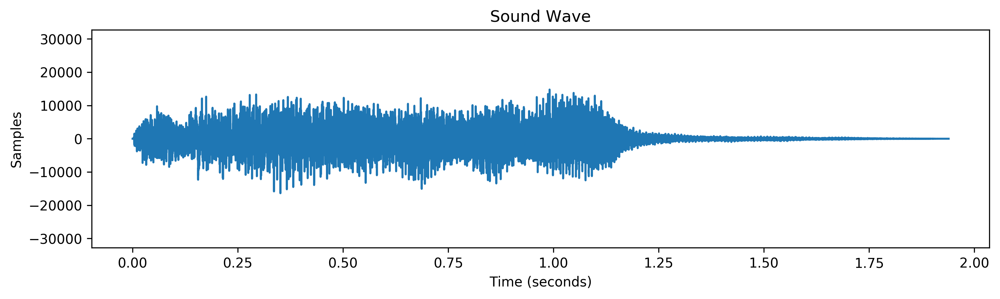

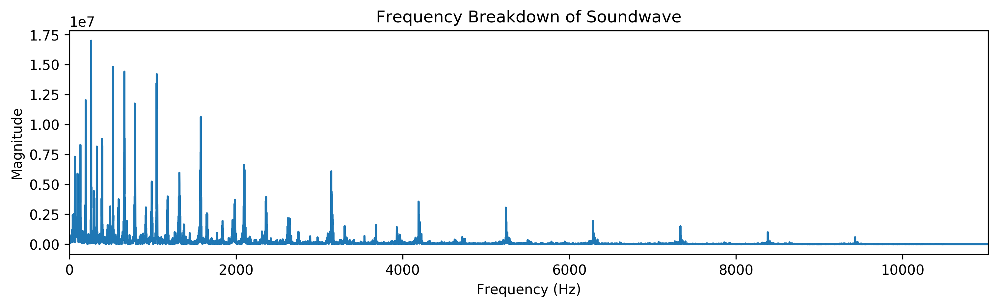

In [82]:
rate, samples = wavfile.read("tada.wav")  # imports the tada wave file, plots it, and allows user to listen interactively
SW = SoundWave(rate,samples)
SW.plot(True)
IPython.display.Audio(rate=rate, data=samples)
IPython.display.Audio(filename="tada.wav")

### Problem 1.2

- Implement `SoundWave.export()`.
- Use the `export()` method to create two new files containing the same sound as `tada.wav`: one without scaling, and one with scaling (use `force=True`).
- Use `IPython.display.Audio()` to embed the original and new versions of `tada.wav` in the notebook.

In [83]:
SW.export("tada1.wav")   # produces tada wave, and the second should be louder, since it is scaled upon forcing
SW.export("tada2.wav",force=True)

In [84]:
IPython.display.Audio(filename="tada1.wav")

In [85]:
IPython.display.Audio(filename="tada2.wav")

### Problem 1.3

- Implement `generate_note()`.
- Use `generate_note()` to create an A tone that lasts for two seconds. Embed it in the notebook.

In [86]:
def generate_note(frequency, duration):
    """Generate an instance of the SoundWave class corresponding to 
    the desired soundwave. Uses sample rate of 44100 Hz.
    
    Parameters:
        frequency (float): The frequency of the desired sound.
        duration (float): The length of the desired sound in seconds.
    
    Returns:
        sound (SoundWave): An instance of the SoundWave class.
    """
    samplerate = 44100
    # the following dictionary is simply for testing different notes
    note_frequency = {'A':440,'B':493.88,'C':523.25,'D':587.33,'E':659.25,'F':698.46,'G':783.99,'A2':880}
    f = lambda x: np.sin(2*np.pi * x * frequency)  # this is the equation used to produce a note
    tics = np.linspace(0,duration,samplerate*duration)
    samples = f(tics)
    SW = SoundWave(samplerate,samples)
    return SW

In [87]:
SW = generate_note(440,2)  # generates and allows the user to listen to a concert A for 2 seconds
IPython.display.Audio(rate=SW.rate, data=SW.samples)

### Problem 1.4

- Implement `SoundWave.__add__()`.
- Generate a three-second A minor chord (A, C, and E) and embed it in the notebook.
- Implement `SoundWave.__rshift__()`.
- Generate the arpeggio A$\,\rightarrow\,$C$\,\rightarrow\,$E, where each tone lasts one second, and embed it in the notebook.

In [88]:
nf={'A':440,'B':493.88,'C':523.25,'D':587.33,'E':659.25}
SWa = generate_note(nf['A'],3)
SWc = generate_note(nf['C'],3)
SWe = generate_note(nf['E'],3)
chord = SWa + SWc + SWe            # this is the three second minor chord
IPython.display.Audio(rate=chord.rate, data=chord.samples)  # this is to play it                     

In [89]:
nf={'A':440,'B':493.88,'C':523.25,'D':587.33,'E':659.25}
SWa = generate_note(nf['A'],1)
SWc = generate_note(nf['C'],1)
SWe = generate_note(nf['E'],1)
arpeggio = SWa >> SWc >> SWe                 # this is the three note arpeggio
IPython.display.Audio(rate=arpeggio.rate, data=arpeggio.samples)  # this is to play it       

### Problem 1.5

- Implement `simple_dft()` with the formula for $c_k$ given below.
- Use `np.allclose()` to check that `simple_dft()` and `scipy.fftpack.fft()` give the same result (after scaling).

$$
c_k = \frac{1}{n}\sum_{\ell=0}^{n-1} f_\ell e^{-2 \pi i k \ell\, /\, n}
$$

In [90]:
def simple_dft(samples):
    """Compute the DFT of an array of samples.

    Parameters:
        samples ((n,) ndarray): an array of samples.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    n = len(samples)
    m = np.array(range(n))
    z = np.outer(m,m)
    M = np.power(np.e,(-2*np.pi*1j*z/n))
    C = M @ samples/n
    return C

In [91]:
a = np.random.random(5)  # here, a random vector is produced and the simple_dft() is tested against scipy's fftpack.
print(simple_dft(a))      # the vector is printed, along with the return value of the comparison.  If it returns true,
np.allclose(simple_dft(a),1/len(a)*fftpack.fft(a))                                          #  then the above code works.

[ 0.38814621+0.j         -0.03414663+0.16433859j  0.04799307-0.03060779j
  0.04799307+0.03060779j -0.03414663-0.16433859j]


True

### Problem 1.6

- Implement `simple_fft()`.
- Generate an array of $8192$ random samples and take its DFT using `simple_dft()`, `simple_fft()`, and `scipy.fftpack.fft()`.
Print the runtimes of each computation.
- Use `np.allclose()` to check that `simple_fft()` and `scipy.fftpack.fft()` give the same result (after scaling).

In [92]:
def simple_fft(samples, threshold=1):
    """Compute the DFT using the FFT algorithm.
    
    Parameters:
        samples ((n,) ndarray): an array of samples.
        threshold (int): when a subarray of samples has fewer
            elements than this integer, use simple_dft() to
            compute the DFT of that subarray.
    
    Returns:
        ((n,) ndarray): The DFT of the given array.
    """
    def split(g):
        n = len(g)
        if n <= threshold:
            return n*simple_dft(g) # use the function from problem 5 for small enough g
        else:
            even = split(g[::2])   # get the DFT of every other entry of g, starting from 0
            odd = split(g[1::2])   # get the DFT of every other entry of g, starting from 1
            k = np.arange(n)
            z = np.e**(-2*np.pi*1j*k/n)  # calculates the exponential parts of the sum
            m = n//2               # gets the middle index for z
            return np.hstack((even + z[:m]*odd, even + z[m:]*odd))
    return split(samples)/len(samples)    

In [93]:
a = np.random.random(8192)  # here, a random vector is produced and the simple_fft() is tested against scipy's fftpack.

%time simple_dft(a)
%time simple_fft(a)
%time fftpack.fft(a)

np.allclose(simple_fft(a),1/len(a)*fftpack.fft(a)) 

Wall time: 11.4 s
Wall time: 446 ms
Wall time: 0 ns


True

### Problem 1.7

- Modify `SoundWave.plot()` so that it accepts a boolean. When the boolean is `True`, take the DFT of the stored samples and plot (in a new subplot) the frequencies present on the $x$-axis and the magnituds of those frequences on the $y$-axis. Only the display the first half of the plot, and adjust the $x$-axis so that it correctly shows the frequencies in Hertz.
- Display the plot of the DFT of an A tone.
- Display the plot of the DFT of an A minor chord.

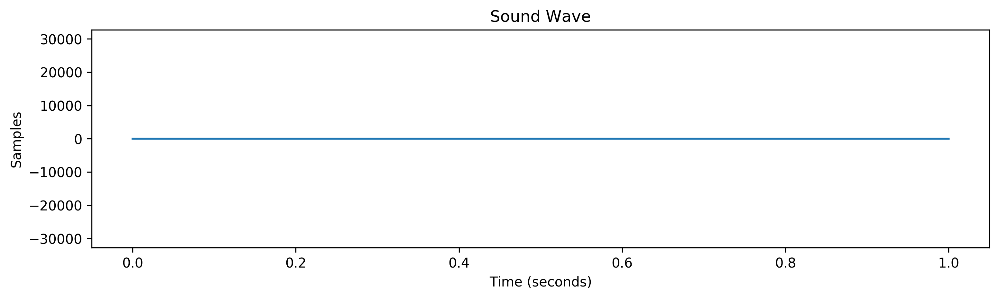

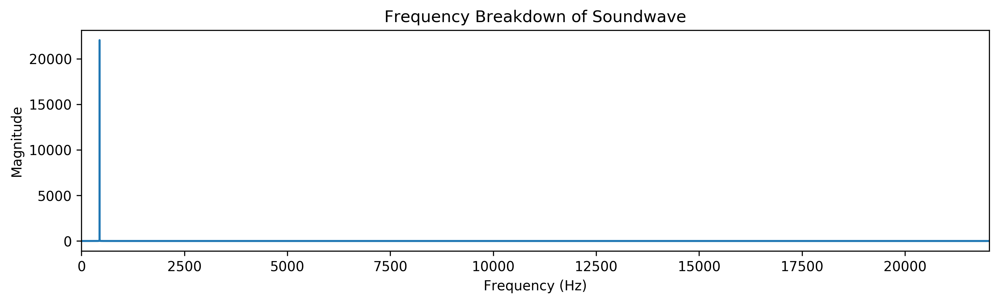

In [94]:
SWa = generate_note(440,1)  # this represents an "A"

SWa.plot(True)  # to plot the note

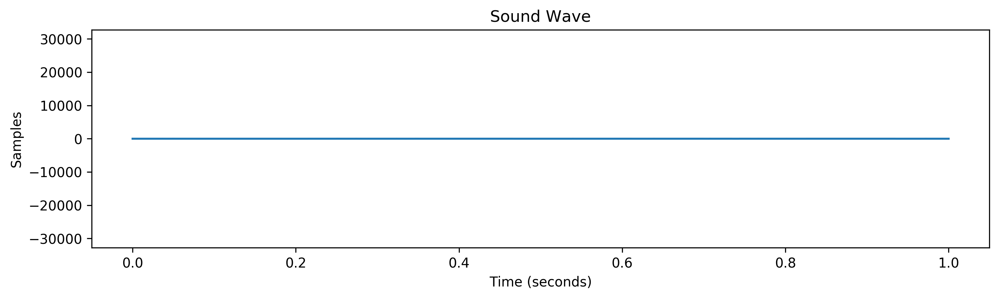

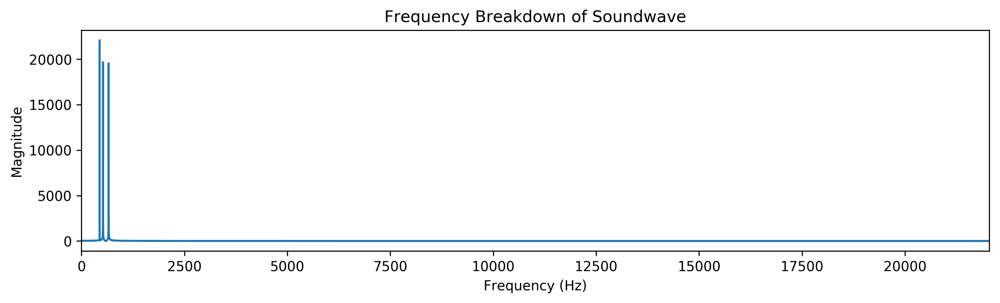

In [95]:
nf={'A':440,'C':523.25,'E':659.25}  # notes needed for an "A-minor" chord
SWa = generate_note(nf['A'],1)
SWc = generate_note(nf['C'],1)
SWe = generate_note(nf['E'],1)
chord = SWa + SWc + SWe

chord.plot(True)  # to plot the chord

### Problem 1.8

Use the DFT to determine the individual notes that are present in `mystery_chord.wav`.

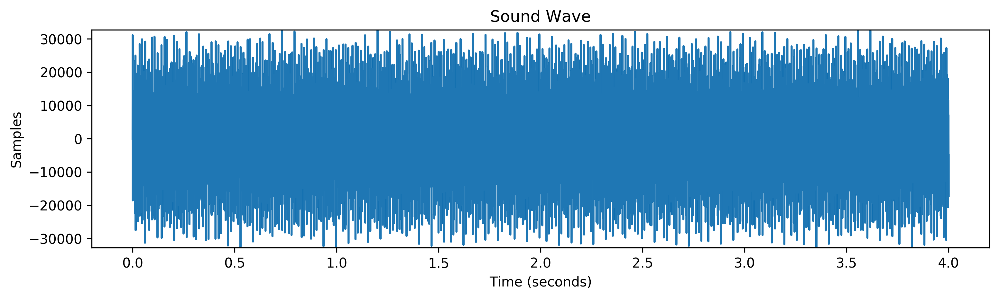

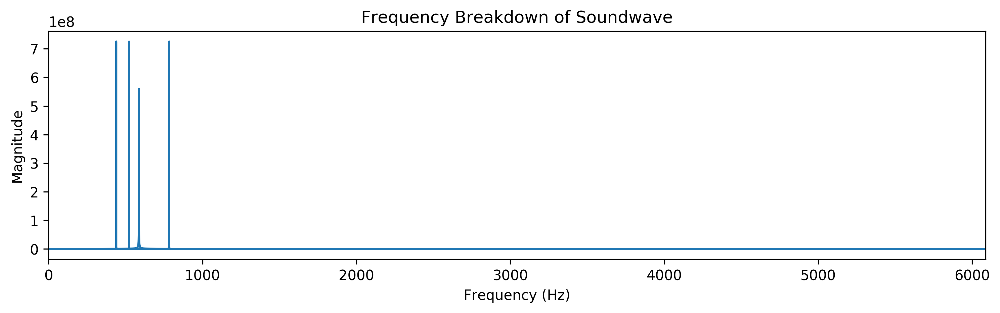

Frequencies: 440.0, 784.0, 523.25, 587.5


In [96]:
rate, samples = wavfile.read("mystery_chord.wav")  # imports the mystery wave file
n = len(samples)
SW = SoundWave(rate,samples)
SW.plot(True)
dft = fftpack.fft(samples)[:n//2]   # we only need to consider the frequencies in the first half of the graph
sort = np.argsort(np.abs(dft))[::-1]  # the reversal is to consider the largest frequencies first, not last
a = sort[0]*rate/n
b = sort[1]*rate/n
c = sort[2]*rate/n
d = sort[3]*rate/n
print("Frequencies: {}, {}, {}, {}".format(a,b,c,d))

The notes are A, G, C, and D


<h2 align="center">Part 2: Convolution and Filtering.</h2>

### Problem 2.1

- Implement `SoundWave.__mul__()` for circular convolution.
- Generate 2 seconds of white noise at the same sample rate as `tada.wav`.
- Compute the circular convolution of `tada.wav` and the white noise. Embed the result in the notebook.
- Append the circular convolution to itself and embed the result in the notebook.

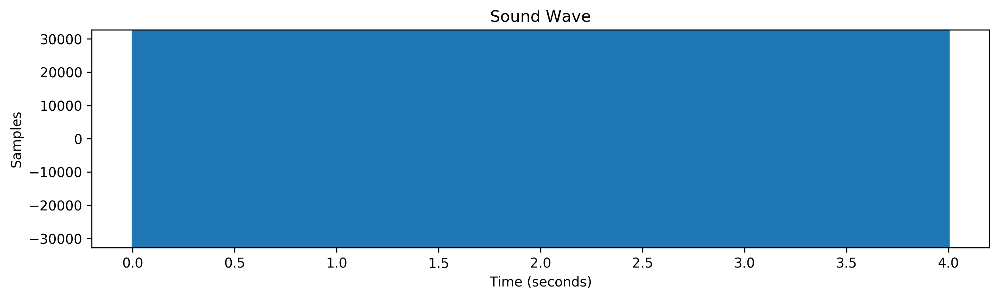

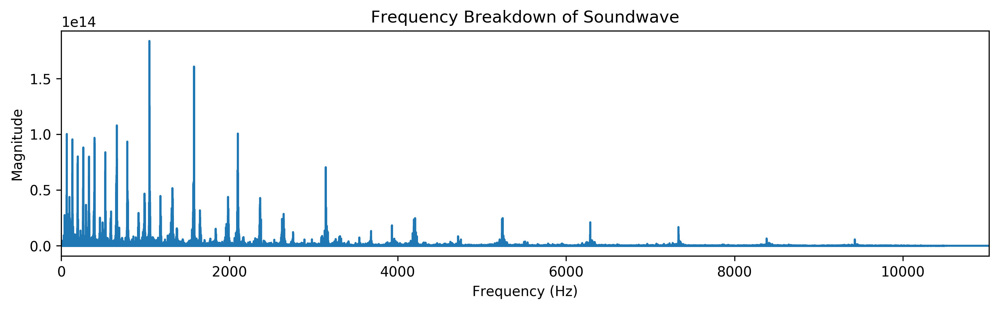

In [97]:
rate = 22050
white_noise = np.random.randint(-32767,32767,rate*2,dtype=np.int16)
WN = SoundWave(rate,white_noise)

rate, samples = wavfile.read("tada.wav")  # imports the tada wave file
SW = SoundWave(rate,samples)
conv = SW*WN
con2 = conv >> conv
con2.plot(True)  # plots the back to back convolution
IPython.display.Audio(rate=con2.rate, data=con2.samples) # this sound plays the back to back convolution


### Problem 2.2

- Implement `SoundWave.__pow__()` for linear convolution.
- Time the linear convolution of `CGC.wav` and `GCG.wav` using `SoundWave.__pow__()` and `scipy.signal.fftconvolve()`.
- Embed the two original sounds and their convolutions in the notebook. Check that the convolutions with `SoundWave.__pow__()` and `scipy.signal.fftconvolve()` sound the same.

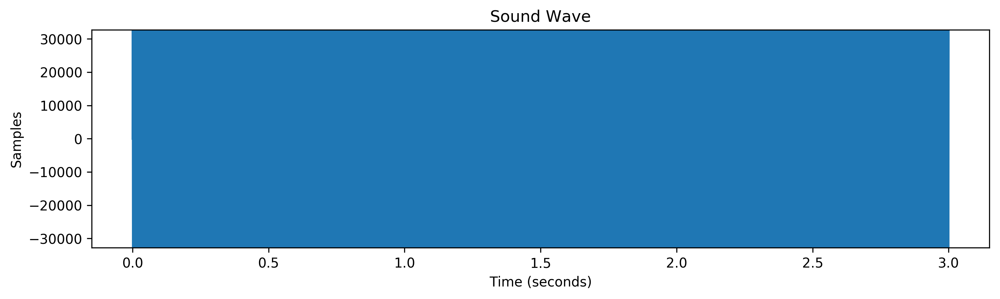

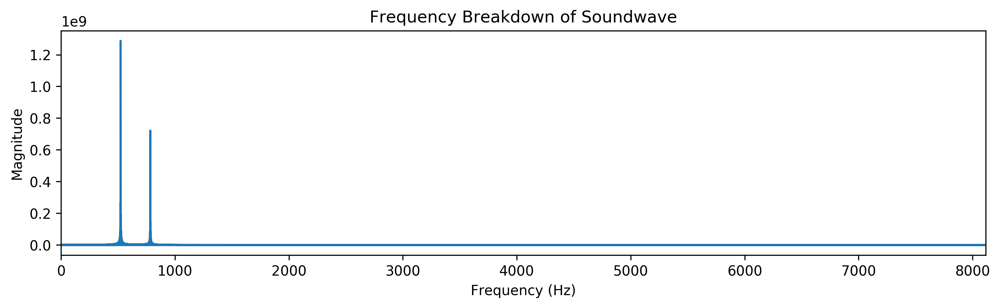

In [98]:
rate, samples = wavfile.read("CGC.wav")  # imports the CGC file
CGC = SoundWave(rate,samples)
CGC.plot(True) 
IPython.display.Audio(rate=CGC.rate, data=CGC.samples)

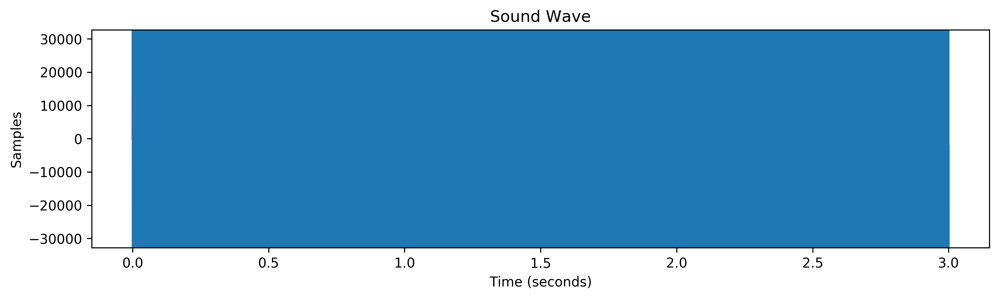

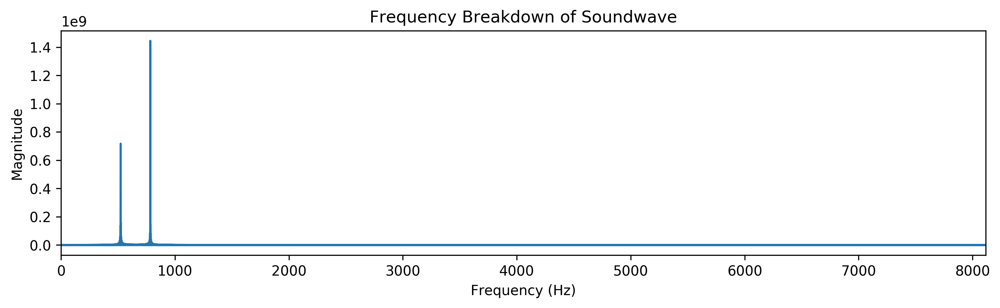

In [99]:
rate1, samples1 = wavfile.read("GCG.wav")  # imports the GCG file
GCG = SoundWave(rate1,samples1)
GCG.plot(True)
IPython.display.Audio(rate=GCG.rate, data=GCG.samples)

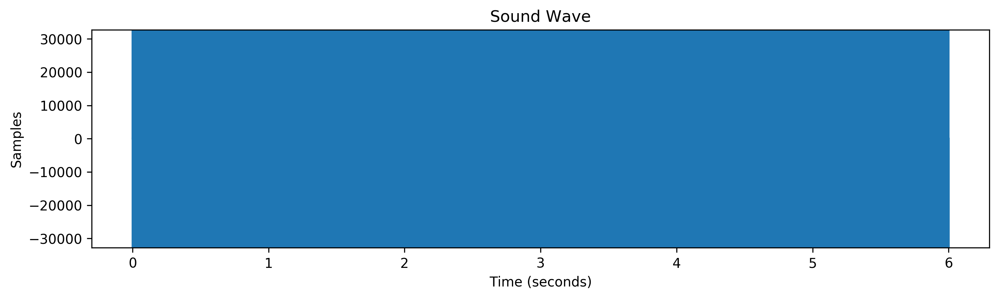

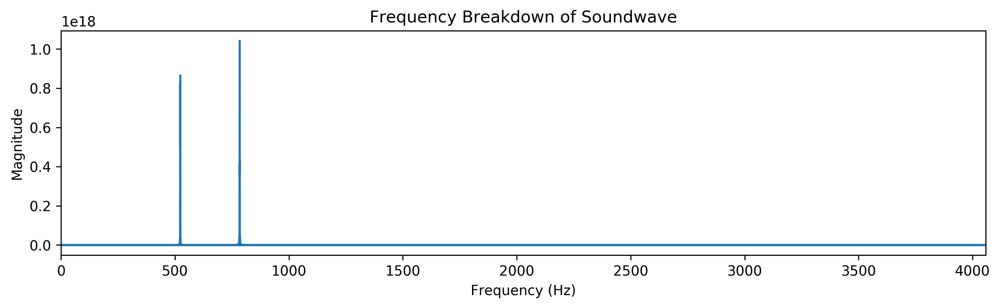

In [100]:
lincon = CGC ** GCG  # does a linear convolution of CGC and GCG
lincon.plot(True)
IPython.display.Audio(rate=lincon.rate, data=lincon.samples)

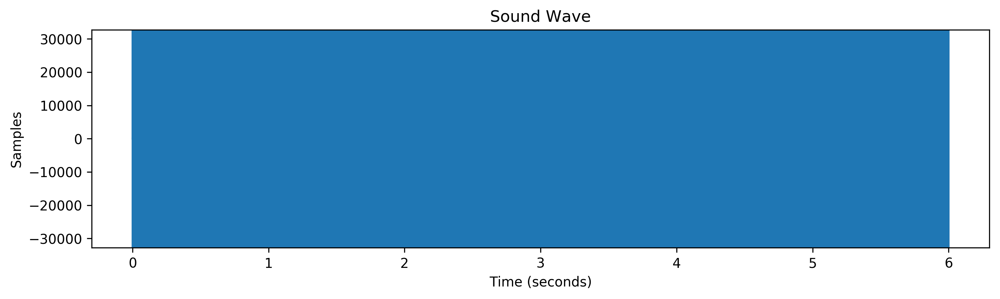

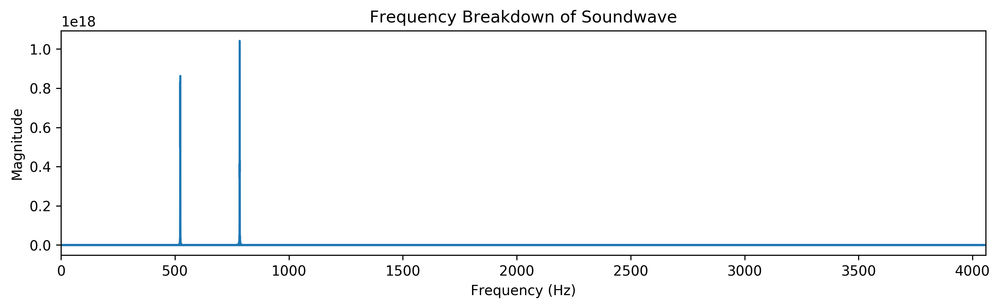

In [101]:
lincon1samp = signal.fftconvolve(CGC.samples,GCG.samples)  # does a linear convolution of GCG and CGC
lincon1 = SoundWave(GCG.rate,lincon1samp)
lincon1.plot(True)
IPython.display.Audio(rate=lincon1.rate, data=lincon1.samples)

### Problem 2.3

Use `SoundWave.__pow__()` or `scipy.signal.fftconvolve()` to compute the linear convolution of `chopin.wav` and `balloon.wav`.
Embed the two original sounds and their convolution in the notebook.

In [102]:
rate, samples = wavfile.read("chopin.wav")  # imports the chopin file
chopin = SoundWave(rate,samples)
IPython.display.Audio(rate=chopin.rate, data=chopin.samples)

In [103]:
rate1, samples1 = wavfile.read("balloon.wav")  # imports the GCG file
balloon = SoundWave(rate1,samples1)
IPython.display.Audio(rate=balloon.rate, data=balloon.samples)

In [104]:
concert = chopin ** balloon  # appropriately convolutes the two
IPython.display.Audio(rate=concert.rate, data=concert.samples)

### Problem 2.4

- Implement `SoundWave.clean()`.
- Clean `noisy1.wav` by filtering out frequencies from $1250$-$2600$ Hz. Embed the original and the cleaned versions in the notebook.
- Clean `noisy2.wav`. Embed the original and the cleaned versions in the notebook.

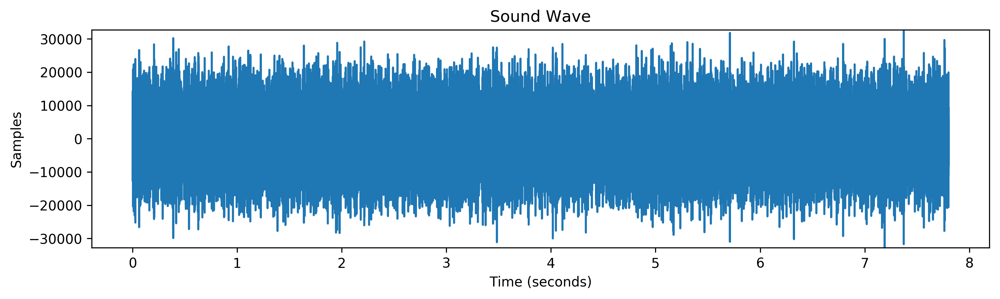

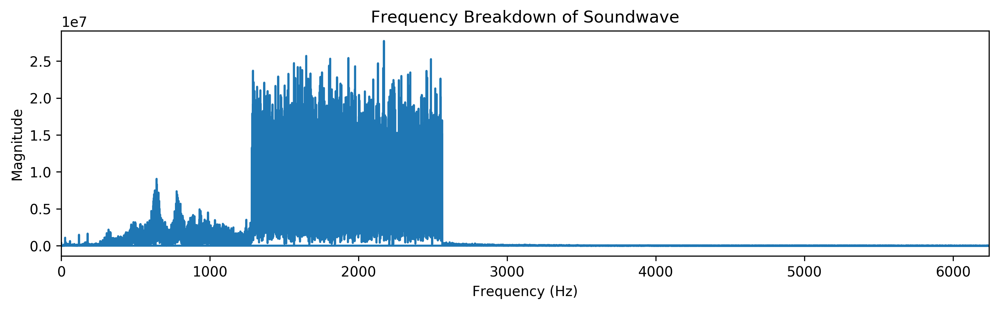

In [105]:
rate, samples = wavfile.read("noisy1.wav")  # imports the noisy1 file
n1 = SoundWave(rate,samples)
n1.plot(True) 
IPython.display.Audio(rate=n1.rate, data=n1.samples)

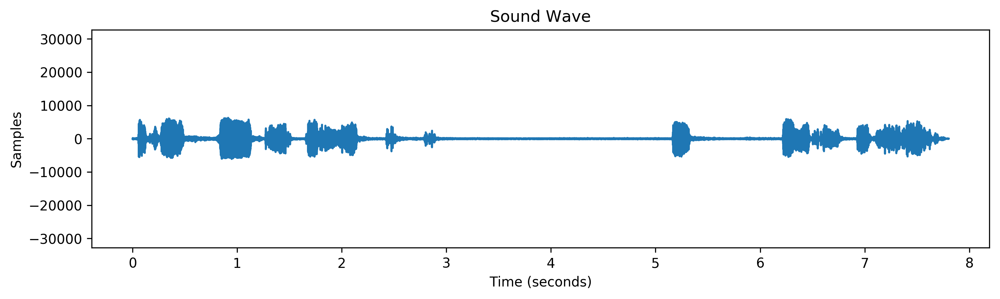

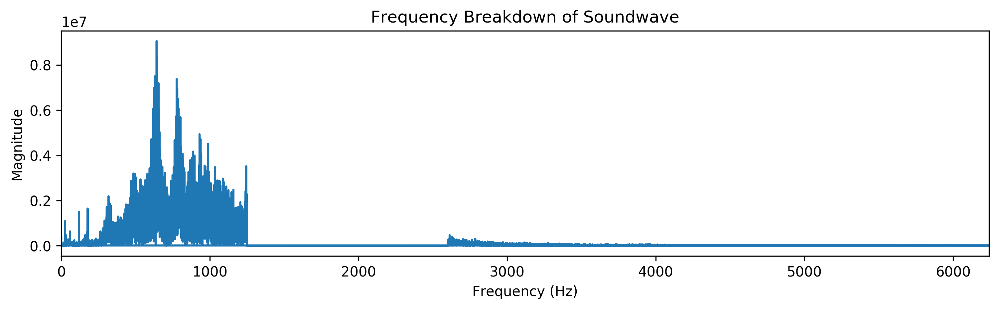

In [106]:
n1.clean(1250,2600)  # cleans the noisy1 file and plots it
n1.plot(True) 
IPython.display.Audio(rate=n1.rate, data=n1.samples)

In [107]:
rate, samples = wavfile.read("noisy2.wav")  # imports the noisy2 file
n2 = SoundWave(rate,samples)
n2.clean(1300,4545)  # cleans it up and plays it
IPython.display.Audio(rate=n2.rate, data=n2.samples)

### Problem 2.5

- Clean `vuvuzela.wav` by filtering bad frequencies out of the left and right channels individually.
- Recombine the left and right channels and embed the result in the notebook.

In [108]:
rate, samples = wavfile.read("vuvuzela.wav")  # imports the vuvuzela file
vu0 = SoundWave(rate,samples[:,0])  # there are two parts to this file, so both are cleaned separately
vu1 = SoundWave(rate,samples[:,1])
vu0.clean(200,500)
vu1.clean(200,500)
vu = SoundWave(rate,[vu0.samples,vu1.samples])
IPython.display.Audio(rate=vu.rate, data=vu.samples)

### Problem 2.6

- Clean up `license_plate.png` so that the year printed on the sticker in the bottom right corner of the plate is legible.
- Display the original and cleaned images.

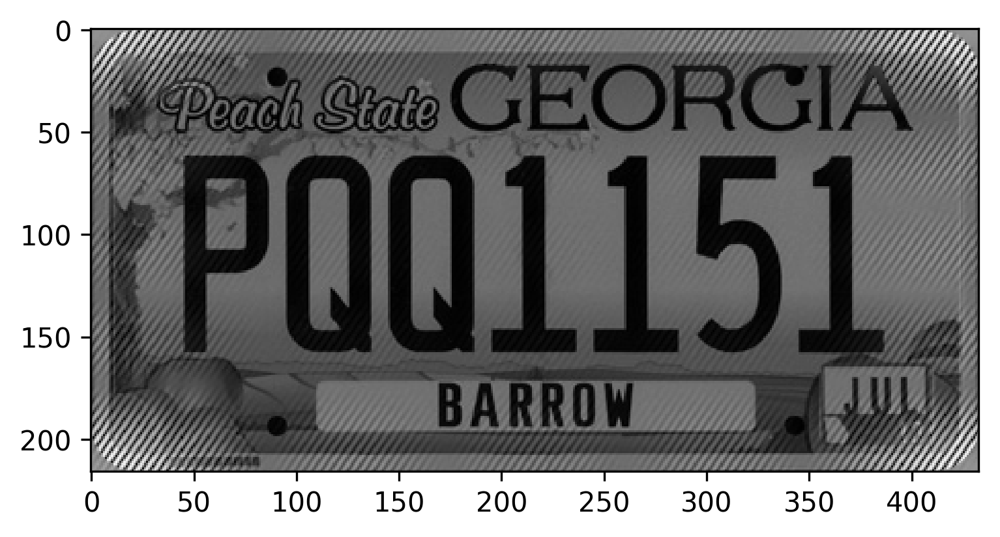

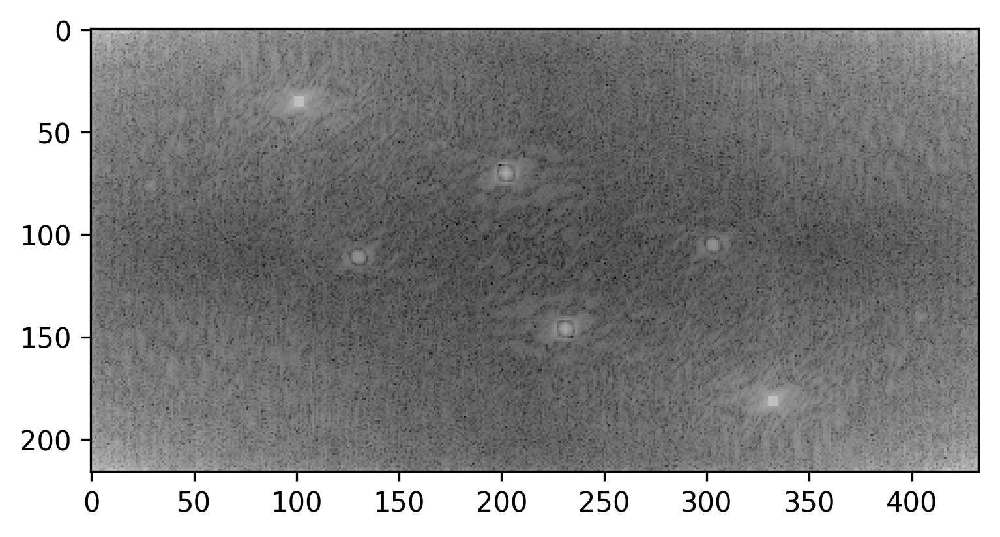

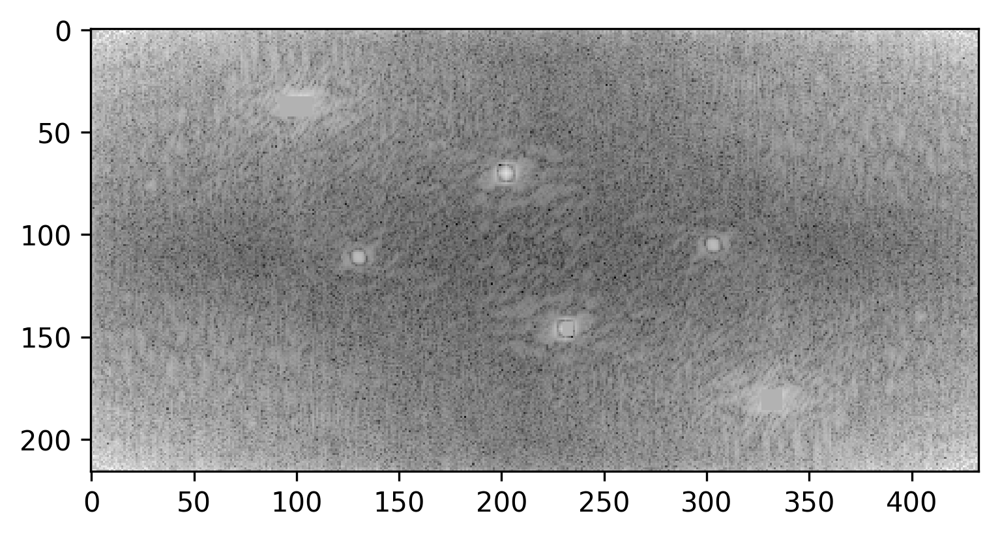

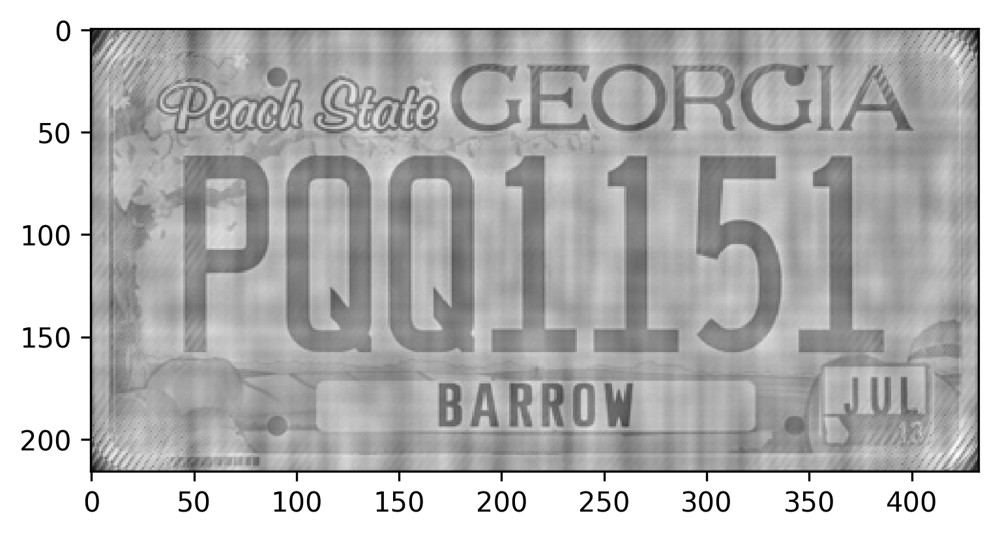

In [109]:
im = imageio.imread("license_plate.png")
plt.imshow(im, cmap="gray")  # plots the origional license plate
plt.show()
im_dft = fft2(im)
plt.imshow(np.log(np.abs(im_dft)), cmap="gray") # plots the origional license plate's DFT
plt.show()
avg = sum(sum(im))/len(im)
new = im_dft.copy()
for (x,y), value in np.ndenumerate(new):  # this for loop is to regulate the extremes
    if value > 22000:
        new[x,y] = 22000
new[143:150,230:235] = 10000   # the following three lines take care of specific patches in the DFT space 
new[33:43,92:108] = 10000 
new[176:186,327:337] = 10000 
plt.imshow(np.log(np.abs(new)), cmap="gray")  # plots the modified DFT
plt.show()
im_new = ifft2(new).real
plt.imshow(im_new, cmap="gray")  # plots the modified license plate
plt.show()

The year on the sticker is 13